### Imports

In [25]:
import cv2
import time
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib
from random import randint

pathRepo = 'C:/Repo/'
pathOpenPose = 'learnopencv/OpenPose-Multi-Person/'
pathLudis = 'GoLudis/Squash/'

In [26]:
#### COCO ####
protoFile = "pose/coco/pose_deploy_linevec.prototxt"
weightsFile = "pose/coco/pose_iter_440000.caffemodel"
nPoints = 18
# COCO Output Format
keypointsMapping = ['Nose', 'Neck', 'R-Sho', 'R-Elb', 'R-Wr', 'L-Sho', 
                    'L-Elb', 'L-Wr', 'R-Hip', 'R-Knee', 'R-Ank', 'L-Hip', 
                    'L-Knee', 'L-Ank', 'R-Eye', 'L-Eye', 'R-Ear', 'L-Ear']

POSE_PAIRS = [[1,2], [1,5], [2,3], [3,4], [5,6], [6,7],
              [1,8], [8,9], [9,10], [1,11], [11,12], [12,13],
              [1,0], [0,14], [14,16], [0,15], [15,17],
              [2,17], [5,16] ]

# index of pafs correspoding to the POSE_PAIRS
# e.g for POSE_PAIR(1,2), the PAFs are located at indices (31,32) of output, Similarly, (1,5) -> (39,40) and so on.
mapIdx = [[31,32], [39,40], [33,34], [35,36], [41,42], [43,44], 
          [19,20], [21,22], [23,24], [25,26], [27,28], [29,30], 
          [47,48], [49,50], [53,54], [51,52], [55,56], 
          [37,38], [45,46]]

colors = [ [0,100,255], [0,100,255], [0,255,255], [0,100,255], [0,255,255], [0,100,255],
         [0,255,0], [255,200,100], [255,0,255], [0,255,0], [255,200,100], [255,0,255],
         [0,0,255], [255,0,0], [200,200,0], [255,0,0], [200,200,0], [0,0,0]]

### Helper Functions

#### getKeyPoints

In [12]:
# Find the Keypoints using Non Maximum Suppression on the Confidence Map
def getKeypoints(probMap, threshold=0.1):
    
    mapSmooth = cv2.GaussianBlur(probMap,(3,3),0,0)

    mapMask = np.uint8(mapSmooth>threshold)
    keypoints = []
    
    #find the blobs
    contours, _ = cv2.findContours(mapMask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    
    #for each blob find the maxima
    for cnt in contours:
        blobMask = np.zeros(mapMask.shape)
        blobMask = cv2.fillConvexPoly(blobMask, cnt, 1)
        maskedProbMap = mapSmooth * blobMask
        _, maxVal, _, maxLoc = cv2.minMaxLoc(maskedProbMap)
        keypoints.append(maxLoc + (probMap[maxLoc[1], maxLoc[0]],))

    return keypoints

#### getValidPairs

In [13]:
# Find valid connections between the different joints of a all persons present
def getValidPairs(output):
    valid_pairs = []
    invalid_pairs = []
    n_interp_samples = 10
    paf_score_th = 0.1
    conf_th = 0.7
    # loop for every POSE_PAIR
    for k in range(len(mapIdx)):
        # A->B constitute a limb
        pafA = output[0, mapIdx[k][0], :, :]
        pafB = output[0, mapIdx[k][1], :, :]
        pafA = cv2.resize(pafA, (frameWidth, frameHeight))
        pafB = cv2.resize(pafB, (frameWidth, frameHeight))

        # Find the keypoints for the first and second limb
        candA = detected_keypoints[POSE_PAIRS[k][0]]
        candB = detected_keypoints[POSE_PAIRS[k][1]]
        nA = len(candA)
        nB = len(candB)

        # If keypoints for the joint-pair is detected
        # check every joint in candA with every joint in candB 
        # Calculate the distance vector between the two joints
        # Find the PAF values at a set of interpolated points between the joints
        # Use the above formula to compute a score to mark the connection valid
        
        if( nA != 0 and nB != 0):
            valid_pair = np.zeros((0,3))
            for i in range(nA):
                max_j=-1
                maxScore = -1
                found = 0
                for j in range(nB):
                    # Find d_ij
                    d_ij = np.subtract(candB[j][:2], candA[i][:2])
                    norm = np.linalg.norm(d_ij)
                    if norm:
                        d_ij = d_ij / norm
                    else:
                        continue
                    # Find p(u)
                    interp_coord = list(zip(np.linspace(candA[i][0], candB[j][0], num=n_interp_samples),
                                            np.linspace(candA[i][1], candB[j][1], num=n_interp_samples)))
                    # Find L(p(u))
                    paf_interp = []
                    for k in range(len(interp_coord)):
                        paf_interp.append([pafA[int(round(interp_coord[k][1])), int(round(interp_coord[k][0]))],
                                           pafB[int(round(interp_coord[k][1])), int(round(interp_coord[k][0]))] ]) 
                    # Find E
                    paf_scores = np.dot(paf_interp, d_ij)
                    avg_paf_score = sum(paf_scores)/len(paf_scores)
                    
                    # Check if the connection is valid
                    # If the fraction of interpolated vectors aligned with PAF is higher then threshold -> Valid Pair  
                    if ( len(np.where(paf_scores > paf_score_th)[0]) / n_interp_samples ) > conf_th :
                        if avg_paf_score > maxScore:
                            max_j = j
                            maxScore = avg_paf_score
                            found = 1
                # Append the connection to the list
                if found:            
                    valid_pair = np.append(valid_pair, [[candA[i][3], candB[max_j][3], maxScore]], axis=0)

            # Append the detected connections to the global list
            valid_pairs.append(valid_pair)
        else: # If no keypoints are detected
            #print("No Connection : k = {}".format(k))
            invalid_pairs.append(k)
            valid_pairs.append([])
    #print(valid_pairs)
    return valid_pairs, invalid_pairs

#### getPersonwiseKeypoints

In [14]:
# This function creates a list of keypoints belonging to each person
# For each detected valid pair, it assigns the joint(s) to a person
# It finds the person and index at which the joint should be added. This can be done since we have an id for each joint
def getPersonwiseKeypoints(valid_pairs, invalid_pairs):
    # the last number in each row is the overall score 
    personwiseKeypoints = -1 * np.ones((0, 19))

    for k in range(len(mapIdx)):
        if k not in invalid_pairs:
            partAs = valid_pairs[k][:,0]
            partBs = valid_pairs[k][:,1]
            indexA, indexB = np.array(POSE_PAIRS[k])

            for i in range(len(valid_pairs[k])): 
                found = 0
                person_idx = -1
                for j in range(len(personwiseKeypoints)):
                    if personwiseKeypoints[j][indexA] == partAs[i]:
                        person_idx = j
                        found = 1
                        break

                if found:
                    personwiseKeypoints[person_idx][indexB] = partBs[i]
                    personwiseKeypoints[person_idx][-1] += keypoints_list[partBs[i].astype(int), 2] + valid_pairs[k][i][2]

                # if find no partA in the subset, create a new subset
                elif not found and k < 17:
                    row = -1 * np.ones(19)
                    row[indexA] = partAs[i]
                    row[indexB] = partBs[i]
                    # add the keypoint_scores for the two keypoints and the paf_score 
                    row[-1] = sum(keypoints_list[valid_pairs[k][i,:2].astype(int), 2]) + valid_pairs[k][i][2]
                    personwiseKeypoints = np.vstack([personwiseKeypoints, row])
    return personwiseKeypoints

### Network

#### Load Video

In [16]:
image1 = cv2.imread(pathRepo+pathOpenPose+"group.jpg")
frameWidth = image1.shape[1]
frameHeight = image1.shape[0]

In [ ]:
cap = cv2.VideoCapture(pathRepo+pathLudis+'squash-trim.avi')

frameWidth = cap.get(cv2.CAP_PROP_FRAME_WIDTH)
frameHeight = cap.get(cv2.CAP_PROP_FRAME_HEIGHT)

#### Load Network and Forward Pass

The **output** is a 4D matrix : **(image ID, keypoint index, height, width)**

The second dimension indicates the index of a keypoint. The model produces Confidence Maps and Part Affinity maps which are all concatenated. For COCO model it consists of 57 parts – 18 keypoint confidence Maps + 1 background + 19*2 Part Affinity Maps. Similarly, for MPI, it produces 44 points. We will be using only the first few points which correspond to Keypoints.

In [ ]:
net = cv2.dnn.readNetFromCaffe(pathRepo+pathOpenPose+protoFile, pathRepo+pathOpenPose+weightsFile)

In [37]:
def frameForwardPass(frame, net):
    t = time.time()
    
    # Fix the input Height and get the width according to the Aspect Ratio
    inHeight = 368
    inWidth = int((inHeight/frameHeight)*frameWidth)

    inpBlob = cv2.dnn.blobFromImage(frame, 
                                    scalefactor=1.0 / 255, # multiplier for image values.
                                    size=(inWidth, inHeight), # spatial size for output image
                                    mean=(0, 0, 0), # scalar with mean values which are subtracted from channels. Values are intended to be in (mean-R, mean-G, mean-B)
                                    swapRB=False, # flag which indicates that swap first and last channels (BGR2RGB)
                                    crop=False) # flag which indicates whether image will be cropped after resize or not
    net.setInput(inpBlob)
    output = net.forward()
    #print("Time Taken for Frame= {}".format(time.time() - t))
    
    return output

#### Slice a probability map ( for e.g Nose ) from the output for a specific keypoint and plot the heatmap ( after resizing ) on the image itself

In [38]:
def detectKeypoints(frame, output, threshold, nPoints, keypointsMapping):
    detected_keypoints = []
    keypoints_list = np.zeros((0,3))
    keypoint_id = 0
    threshold = 0.1

    for part in range(nPoints):
        probMap = output[0,part,:,:]
        probMap = cv2.resize(probMap, (frame.shape[1], frame.shape[0]))
    #     plt.figure()
    #     plt.imshow(255*np.uint8(probMap>threshold))
        keypoints = getKeypoints(probMap, threshold) # Non-Max Supression
        #print("Keypoints - {} : {}".format(keypointsMapping[part], keypoints))
        keypoints_with_id = []
        for i in range(len(keypoints)):
            keypoints_with_id.append(keypoints[i] + (keypoint_id,))
            keypoints_list = np.vstack([keypoints_list, keypoints[i]])
            keypoint_id += 1

        detected_keypoints.append(keypoints_with_id)
    
    return keypoints_list, detected_keypoints

#### Keypoints Detection on Frame

In [39]:
def assignKeypoints(frame, net_output, detected_keypoints, keypoints_list):
    # Detect Keypoints
    valid_pairs, invalid_pairs = getValidPairs(net_output)
    personwiseKeypoints = getPersonwiseKeypoints(valid_pairs, invalid_pairs)

    frameClone = frame.copy()
    for i in range(nPoints):
        for j in range(len(detected_keypoints[i])):
            cv2.circle(frameClone, detected_keypoints[i][j][0:2], 3, [0,0,255], -1, cv2.LINE_AA)

    for i in range(17):
        for n in range(len(personwiseKeypoints)):
            index = personwiseKeypoints[n][np.array(POSE_PAIRS[i])]
            if -1 in index:
                continue
            B = np.int32(keypoints_list[index.astype(int), 0])
            A = np.int32(keypoints_list[index.astype(int), 1])
            cv2.line(frameClone, (B[0], A[0]), (B[1], A[1]), colors[i], 3, cv2.LINE_AA)
    
    return frameClone 

In [46]:
cap = cv2.VideoCapture(pathRepo+pathLudis+'squash-trim.avi')

frameWidth = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frameHeight = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

net = cv2.dnn.readNetFromCaffe(pathRepo+pathOpenPose+protoFile, pathRepo+pathOpenPose+weightsFile)

[array([[11.        , 22.        ,  0.23185243],
       [13.        , 24.        ,  0.47322187],
       [14.        , 25.        ,  0.59261332],
       [15.        , 26.        ,  0.98256009],
       [16.        , 27.        ,  0.1828049 ],
       [17.        , 28.        ,  0.509322  ],
       [18.        , 29.        ,  0.95090027],
       [19.        , 30.        ,  0.66447824],
       [20.        , 31.        ,  0.72906067],
       [21.        , 32.        ,  0.55533986]]), array([[11.        , 54.        ,  0.25139086],
       [12.        , 57.        ,  0.40776624],
       [13.        , 56.        ,  0.49670051],
       [14.        , 57.        ,  0.71806426],
       [15.        , 58.        ,  0.9764236 ],
       [17.        , 60.        ,  0.56492683],
       [18.        , 62.        ,  0.73947693],
       [19.        , 61.        ,  0.45512261],
       [20.        , 63.        ,  0.75639573]]), array([[22.        , 33.        ,  0.20739255],
       [23.        , 34.        ,  

[array([[11.        , 23.        ,  0.18952208],
       [13.        , 25.        ,  0.46750272],
       [14.        , 26.        ,  0.53706945],
       [15.        , 27.        ,  0.90540597],
       [16.        , 28.        ,  0.19650266],
       [17.        , 29.        ,  0.47265753],
       [19.        , 31.        ,  0.96230198],
       [20.        , 32.        ,  0.65026659],
       [21.        , 33.        ,  0.68544459],
       [22.        , 34.        ,  0.5709751 ]]), array([[12.        , 55.        ,  0.33767502],
       [13.        , 56.        ,  0.4777196 ],
       [14.        , 57.        ,  0.30921746],
       [15.        , 58.        ,  0.93442524],
       [17.        , 59.        ,  0.5341686 ],
       [19.        , 62.        ,  0.73977601],
       [20.        , 61.        ,  0.43960753],
       [21.        , 63.        ,  0.72980481]]), array([[23.        , 35.        ,  0.15538782],
       [24.        , 36.        ,  0.77090575],
       [25.        , 37.        ,  

[array([[10.        , 22.        ,  0.43033729],
       [12.        , 23.        ,  0.57018524],
       [13.        , 24.        ,  0.58178065],
       [14.        , 25.        ,  0.84141465],
       [15.        , 26.        ,  0.13659079],
       [16.        , 27.        ,  0.50823694],
       [17.        , 28.        ,  0.9802923 ],
       [18.        , 29.        ,  0.52173561],
       [19.        , 30.        ,  0.67746941],
       [20.        , 31.        ,  0.54299079]]), array([[10.        , 49.        ,  0.46233642],
       [11.        , 52.        ,  0.37939832],
       [12.        , 51.        ,  0.4806463 ],
       [13.        , 52.        ,  0.34320553],
       [14.        , 53.        ,  0.88392926],
       [16.        , 54.        ,  0.5665844 ],
       [17.        , 57.        ,  0.76313038],
       [18.        , 56.        ,  0.53912382],
       [19.        , 58.        ,  0.70589176]]), array([[21.        , 32.        ,  0.75619971],
       [22.        , 33.        ,  

[array([[ 9.        , 21.        ,  0.55417197],
       [11.        , 22.        ,  0.59907591],
       [12.        , 23.        ,  0.63308673],
       [13.        , 24.        ,  0.90914147],
       [14.        , 25.        ,  0.17624756],
       [15.        , 26.        ,  0.48215829],
       [16.        , 27.        ,  0.98125829],
       [17.        , 28.        ,  0.57918197],
       [18.        , 29.        ,  0.74437715],
       [19.        , 30.        ,  0.53968034]]), array([[ 9.        , 50.        ,  0.5820913 ],
       [10.        , 51.        ,  0.38581172],
       [11.        , 52.        ,  0.50805768],
       [12.        , 55.        ,  0.32853039],
       [13.        , 53.        ,  0.95055982],
       [15.        , 54.        ,  0.53803461],
       [16.        , 56.        ,  0.97577896],
       [17.        , 57.        ,  0.59352734],
       [18.        , 58.        ,  0.75033405],
       [19.        , 59.        ,  0.53523767]]), array([[20.        , 31.        ,  

[array([[ 9.        , 21.        ,  0.57987595],
       [11.        , 22.        ,  0.60991679],
       [12.        , 23.        ,  0.62459785],
       [13.        , 24.        ,  0.96854258],
       [15.        , 26.        ,  0.98107609],
       [16.        , 27.        ,  0.51210627],
       [17.        , 28.        ,  0.55850631],
       [18.        , 29.        ,  0.75134512],
       [19.        , 30.        ,  0.54751145]]), array([[ 9.        , 48.        ,  0.60219258],
       [10.        , 49.        ,  0.38765049],
       [11.        , 50.        ,  0.51232734],
       [12.        , 51.        ,  0.33043241],
       [13.        , 52.        ,  0.94506736],
       [15.        , 54.        ,  0.97970991],
       [16.        , 53.        ,  0.57317669],
       [17.        , 56.        ,  0.56663944],
       [18.        , 57.        ,  0.75415233],
       [19.        , 58.        ,  0.56777963]]), array([[20.        , 31.        ,  0.77809562],
       [21.        , 32.        ,  

[array([[ 9.        , 21.        ,  0.58367582],
       [11.        , 22.        ,  0.51735918],
       [12.        , 23.        ,  0.55305228],
       [13.        , 24.        ,  0.91597259],
       [14.        , 25.        ,  0.90068873],
       [16.        , 27.        ,  0.42101871],
       [17.        , 28.        ,  0.57868394],
       [18.        , 29.        ,  0.77778511],
       [19.        , 30.        ,  0.53407324]]), array([[ 9.        , 50.        ,  0.60373968],
       [10.        , 51.        ,  0.39068742],
       [11.        , 52.        ,  0.42260889],
       [12.        , 53.        ,  0.31854819],
       [13.        , 54.        ,  0.89778836],
       [14.        , 55.        ,  0.88153441],
       [16.        , 56.        ,  0.47702966],
       [17.        , 58.        ,  0.5919474 ],
       [18.        , 59.        ,  0.77485791],
       [19.        , 60.        ,  0.55400994]]), array([[20.        , 31.        ,  0.77006276],
       [21.        , 32.        ,  

[array([[10.        , 23.        ,  0.58527315],
       [12.        , 24.        ,  0.43226813],
       [13.        , 25.        ,  0.55779959],
       [14.        , 26.        ,  0.9588817 ],
       [15.        , 28.        ,  0.13645331],
       [17.        , 29.        ,  0.54124276],
       [18.        , 30.        ,  0.64596907],
       [19.        , 31.        ,  0.74047394],
       [20.        , 32.        ,  0.57836808]]), array([[10.        , 52.        ,  0.60844406],
       [11.        , 53.        ,  0.38434224],
       [12.        , 54.        ,  0.34805013],
       [13.        , 55.        ,  0.31571759],
       [14.        , 56.        ,  0.97388113],
       [15.        , 57.        ,  0.94213487],
       [17.        , 58.        ,  0.59043243],
       [18.        , 60.        ,  0.45905935],
       [19.        , 61.        ,  0.74749607]]), array([[22.        , 34.        ,  0.7739282 ],
       [23.        , 35.        ,  0.48617871],
       [24.        , 36.        ,  

[array([[12.        , 26.        ,  0.58027411],
       [14.        , 27.        ,  0.45109361],
       [15.        , 28.        ,  0.57063521],
       [16.        , 29.        ,  0.95733719],
       [17.        , 31.        ,  0.75029314],
       [19.        , 32.        ,  0.50272912],
       [20.        , 34.        ,  0.25938709],
       [21.        , 33.        ,  0.64847479],
       [22.        , 34.        ,  0.68281509],
       [23.        , 35.        ,  0.60666215]]), array([[12.        , 54.        ,  0.60223648],
       [13.        , 55.        ,  0.38702682],
       [14.        , 56.        ,  0.37638336],
       [15.        , 60.        ,  0.33330597],
       [16.        , 57.        ,  0.98091702],
       [17.        , 58.        ,  0.8410255 ],
       [19.        , 59.        ,  0.55296757],
       [21.        , 61.        ,  0.46162669],
       [22.        , 62.        ,  0.69455788],
       [24.        , 64.        ,  0.11650157]]), array([[25.        , 37.        ,  

[array([[11.        , 23.        ,  0.57474929],
       [13.        , 24.        ,  0.5455085 ],
       [14.        , 25.        ,  0.61950472],
       [15.        , 27.        ,  0.77745333],
       [16.        , 28.        ,  0.63724988],
       [17.        , 26.        ,  0.1512957 ],
       [18.        , 29.        ,  0.55835081],
       [19.        , 30.        ,  0.66974725],
       [20.        , 31.        ,  0.77319712],
       [21.        , 32.        ,  0.58942499]]), array([[11.        , 53.        ,  0.61487207],
       [12.        , 54.        ,  0.39047192],
       [13.        , 55.        ,  0.45761152],
       [14.        , 56.        ,  0.32903221],
       [15.        , 58.        ,  0.699431  ],
       [16.        , 57.        ,  0.6003331 ],
       [18.        , 59.        ,  0.60490351],
       [19.        , 61.        ,  0.47146788],
       [20.        , 62.        ,  0.79449216],
       [21.        , 63.        ,  0.62529024]]), array([[22.        , 33.        ,  

[array([[11.        , 23.        ,  0.43805305],
       [13.        , 24.        ,  0.59461491],
       [14.        , 25.        ,  0.6661267 ],
       [16.        , 28.        ,  0.69421009],
       [17.        , 26.        ,  0.17137095],
       [18.        , 29.        ,  0.54118306],
       [19.        , 30.        ,  0.67020451],
       [20.        , 32.        ,  0.80627743],
       [21.        , 33.        ,  0.55245087]]), array([[11.        , 54.        ,  0.48043415],
       [12.        , 57.        ,  0.42282875],
       [13.        , 56.        ,  0.50405688],
       [14.        , 57.        ,  0.59078281],
       [16.        , 58.        ,  0.22813249],
       [18.        , 60.        ,  0.64151373],
       [19.        , 62.        ,  0.59680945],
       [20.        , 63.        ,  0.82471799]]), array([[22.        , 34.        ,  0.76291867],
       [23.        , 35.        ,  0.27238647],
       [24.        , 36.        ,  0.38025658],
       [26.        , 34.        ,  

[array([[11.        , 24.        ,  0.51481588],
       [13.        , 25.        ,  0.65511475],
       [14.        , 26.        ,  0.68023289],
       [15.        , 27.        ,  0.51780435],
       [16.        , 29.        ,  0.76752058],
       [17.        , 28.        ,  0.17179319],
       [18.        , 30.        ,  0.45248579],
       [19.        , 31.        ,  0.64251244],
       [20.        , 32.        ,  0.65055051],
       [21.        , 33.        ,  0.54889733],
       [22.        , 34.        ,  0.19372669]]), array([[11.        , 55.        ,  0.56369081],
       [12.        , 58.        ,  0.43215191],
       [13.        , 57.        ,  0.55885416],
       [14.        , 58.        ,  0.60357234],
       [16.        , 60.        ,  0.77865204],
       [18.        , 61.        ,  0.18152615],
       [19.        , 63.        ,  0.50734495],
       [20.        , 64.        ,  0.66185523],
       [21.        , 65.        ,  0.55949306],
       [22.        , 66.        ,  0.

C:\Users\fabri\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


[array([[11.        , 23.        ,  0.52233272],
       [13.        , 24.        ,  0.51579937],
       [14.        , 25.        ,  0.6321646 ],
       [15.        , 26.        ,  0.78210157],
       [16.        , 28.        ,  0.65048945],
       [17.        , 27.        ,  0.1578509 ],
       [18.        , 29.        ,  0.47494926],
       [19.        , 30.        ,  0.64125571],
       [20.        , 31.        ,  0.79111375],
       [21.        , 32.        ,  0.54607639]]), array([[11.        , 52.        ,  0.57498297],
       [12.        , 53.        ,  0.39359237],
       [13.        , 54.        ,  0.4347808 ],
       [14.        , 55.        ,  0.66157898],
       [16.        , 57.        ,  0.58841557],
       [18.        , 58.        ,  0.50545465],
       [19.        , 60.        ,  0.65396563],
       [20.        , 61.        ,  0.81794357]]), array([[22.        , 33.        ,  0.76440114],
       [23.        , 34.        ,  0.33941488],
       [24.        , 35.        ,  

[array([[11.        , 24.        ,  0.45154074],
       [13.        , 25.        ,  0.46515904],
       [14.        , 26.        ,  0.70566038],
       [15.        , 27.        ,  0.97666408],
       [16.        , 29.        ,  0.90326067],
       [17.        , 28.        ,  0.24644658],
       [18.        , 30.        ,  0.47431756],
       [19.        , 31.        ,  0.66017222],
       [20.        , 32.        ,  0.84487752],
       [21.        , 33.        ,  0.47771567],
       [22.        , 34.        ,  0.12145612]]), array([[11.        , 54.        ,  0.5034917 ],
       [12.        , 55.        ,  0.38744374],
       [13.        , 56.        ,  0.38761927],
       [14.        , 57.        ,  0.71613912],
       [15.        , 58.        ,  0.71069788],
       [16.        , 59.        ,  0.9082535 ],
       [18.        , 60.        ,  0.5166765 ],
       [19.        , 62.        ,  0.51869646],
       [20.        , 63.        ,  0.856047  ]]), array([[23.        , 35.        ,  

[array([[11.        , 23.        ,  0.41007776],
       [13.        , 24.        ,  0.3184887 ],
       [14.        , 25.        ,  0.70083194],
       [15.        , 26.        ,  0.91790854],
       [16.        , 27.        ,  0.9130105 ],
       [17.        , 28.        ,  0.23652626],
       [18.        , 29.        ,  0.47494467],
       [19.        , 30.        ,  0.610347  ],
       [20.        , 31.        ,  0.81993608],
       [21.        , 32.        ,  0.50287619]]), array([[11.        , 54.        ,  0.43820748],
       [12.        , 55.        ,  0.37398811],
       [13.        , 56.        ,  0.25397357],
       [14.        , 57.        ,  0.71340156],
       [15.        , 58.        ,  0.95649658],
       [16.        , 59.        ,  0.88669756],
       [17.        , 61.        ,  0.25858654],
       [18.        , 60.        ,  0.52227963],
       [19.        , 62.        ,  0.61660033],
       [20.        , 63.        ,  0.83533857],
       [21.        , 64.        ,  0.

[array([[11.        , 24.        ,  0.43552316],
       [13.        , 25.        ,  0.31228964],
       [14.        , 26.        ,  0.72203932],
       [15.        , 27.        ,  0.95045437],
       [16.        , 28.        ,  0.94751619],
       [17.        , 29.        ,  0.18052263],
       [18.        , 30.        ,  0.44653367],
       [19.        , 31.        ,  0.60841674],
       [20.        , 32.        ,  0.83147225],
       [21.        , 33.        ,  0.50118748],
       [22.        , 34.        ,  0.18598343]]), array([[11.        , 56.        ,  0.46968991],
       [12.        , 57.        ,  0.37253675],
       [13.        , 58.        ,  0.24380209],
       [14.        , 59.        ,  0.72762055],
       [15.        , 60.        ,  0.95384641],
       [16.        , 61.        ,  0.95951901],
       [18.        , 62.        ,  0.48784096],
       [19.        , 64.        ,  0.4821152 ],
       [20.        , 65.        ,  0.84597712],
       [21.        , 66.        ,  0.

[array([[12.        , 25.        ,  0.13055927],
       [14.        , 26.        ,  0.32845502],
       [15.        , 27.        ,  0.93887388],
       [16.        , 28.        ,  0.74297794],
       [17.        , 29.        ,  0.89167372],
       [19.        , 31.        ,  0.49720529],
       [20.        , 32.        ,  0.67746701],
       [21.        , 33.        ,  0.80753997],
       [22.        , 34.        ,  0.56978178],
       [23.        , 35.        ,  0.20922037]]), array([[12.        , 55.        ,  0.35634904],
       [13.        , 56.        ,  0.38076465],
       [14.        , 57.        ,  0.3498418 ],
       [15.        , 58.        ,  0.9520587 ],
       [16.        , 59.        ,  0.74664984],
       [17.        , 60.        ,  0.88736609],
       [18.        , 62.        ,  0.23637299],
       [19.        , 61.        ,  0.23710707],
       [20.        , 63.        ,  0.31357519],
       [21.        , 64.        ,  0.8317248 ],
       [22.        , 65.        ,  0.

[array([[11.        , 24.        ,  0.4308869 ],
       [13.        , 25.        ,  0.38401205],
       [14.        , 26.        ,  0.95404835],
       [15.        , 27.        ,  0.76518074],
       [16.        , 28.        ,  0.94397555],
       [17.        , 29.        ,  0.21684646],
       [18.        , 30.        ,  0.50719277],
       [19.        , 31.        ,  0.68770246],
       [20.        , 32.        ,  0.83930675],
       [21.        , 33.        ,  0.58687208],
       [22.        , 34.        ,  0.12474035]]), array([[11.        , 56.        ,  0.46740746],
       [12.        , 57.        ,  0.3682463 ],
       [13.        , 58.        ,  0.41355909],
       [14.        , 59.        ,  0.95126795],
       [15.        , 60.        ,  0.75872004],
       [16.        , 61.        ,  0.95028291],
       [17.        , 63.        ,  0.25189835],
       [18.        , 62.        ,  0.23064294],
       [19.        , 64.        ,  0.51605236],
       [20.        , 65.        ,  0.

[array([[11.        , 23.        ,  0.42416319],
       [13.        , 24.        ,  0.34120048],
       [14.        , 25.        ,  0.91982508],
       [15.        , 26.        ,  0.78058984],
       [16.        , 28.        ,  0.97962027],
       [17.        , 27.        ,  0.23039778],
       [18.        , 29.        ,  0.53417973],
       [19.        , 30.        ,  0.70632651],
       [20.        , 31.        ,  0.82471708],
       [21.        , 32.        ,  0.61131646]]), array([[11.        , 53.        ,  0.43950385],
       [12.        , 54.        ,  0.3742971 ],
       [13.        , 55.        ,  0.36965893],
       [14.        , 56.        ,  0.95320481],
       [15.        , 57.        ,  0.78342896],
       [16.        , 58.        ,  1.00172854],
       [17.        , 60.        ,  0.26153433],
       [18.        , 59.        ,  0.25149189],
       [19.        , 61.        ,  0.52894579],
       [20.        , 62.        ,  0.79372783],
       [21.        , 63.        ,  0.

[array([[11.        , 23.        ,  0.38549015],
       [13.        , 24.        ,  0.44981678],
       [14.        , 25.        ,  0.78583928],
       [15.        , 26.        ,  0.7922262 ],
       [16.        , 28.        ,  0.96851952],
       [17.        , 27.        ,  0.21882766],
       [18.        , 29.        ,  0.58617063],
       [19.        , 30.        ,  0.72460709],
       [20.        , 31.        ,  0.81027836],
       [21.        , 32.        ,  0.61635707]]), array([[11.        , 53.        ,  0.42696266],
       [12.        , 54.        ,  0.38439411],
       [13.        , 55.        ,  0.47555328],
       [14.        , 56.        ,  0.9160309 ],
       [15.        , 57.        ,  0.78650393],
       [16.        , 58.        ,  0.91293445],
       [18.        , 59.        ,  0.28867323],
       [19.        , 61.        ,  0.51699185],
       [20.        , 62.        ,  0.78056076],
       [21.        , 63.        ,  0.6620671 ]]), array([[22.        , 33.        ,  

[array([[11.        , 23.        ,  0.39748268],
       [13.        , 24.        ,  0.73132326],
       [14.        , 25.        ,  0.42884465],
       [15.        , 26.        ,  0.76334345],
       [16.        , 27.        ,  0.14557997],
       [17.        , 28.        ,  0.99661205],
       [18.        , 29.        ,  0.55877577],
       [19.        , 30.        ,  0.7443313 ],
       [20.        , 31.        ,  0.85396383],
       [21.        , 32.        ,  0.51427476]]), array([[11.        , 54.        ,  0.43461379],
       [12.        , 55.        ,  0.36968163],
       [13.        , 56.        ,  0.86837449],
       [14.        , 57.        ,  0.44653354],
       [15.        , 58.        ,  0.76024842],
       [17.        , 61.        ,  0.99650179],
       [18.        , 59.        ,  0.27994635],
       [19.        , 62.        ,  0.53136787],
       [20.        , 63.        ,  0.82565234],
       [21.        , 64.        ,  0.52156766]]), array([[22.        , 33.        ,  

[array([[11.        , 24.        ,  0.43970611],
       [12.        , 23.        ,  0.86128256],
       [14.        , 25.        ,  0.43934923],
       [15.        , 26.        ,  0.76635821],
       [16.        , 27.        ,  0.1365402 ],
       [17.        , 28.        ,  0.5296235 ],
       [18.        , 29.        ,  0.983195  ],
       [19.        , 30.        ,  0.74747619],
       [20.        , 31.        ,  0.85310083],
       [21.        , 32.        ,  0.48485688]]), array([[11.        , 53.        ,  0.47454292],
       [12.        , 54.        ,  0.92478581],
       [13.        , 55.        ,  0.36484461],
       [14.        , 56.        ,  0.456549  ],
       [15.        , 57.        ,  0.76097753],
       [17.        , 58.        ,  0.24006191],
       [18.        , 60.        ,  0.85422634],
       [19.        , 61.        ,  0.53776578],
       [20.        , 62.        ,  0.81843963],
       [21.        , 63.        ,  0.49560639]]), array([[22.        , 33.        ,  

[array([[11.        , 23.        ,  0.87312237],
       [12.        , 25.        ,  0.31416501],
       [14.        , 26.        ,  0.5686488 ],
       [15.        , 27.        ,  0.71236492],
       [16.        , 28.        ,  0.15000315],
       [17.        , 29.        ,  0.54996583],
       [18.        , 30.        ,  1.07988476],
       [19.        , 31.        ,  0.76011828],
       [20.        , 32.        ,  0.7796195 ],
       [21.        , 33.        ,  0.67307724],
       [22.        , 34.        ,  0.15226067]]), array([[11.        , 58.        ,  0.7870067 ],
       [12.        , 57.        ,  0.34248561],
       [13.        , 59.        ,  0.37294036],
       [14.        , 60.        ,  0.48200105],
       [15.        , 61.        ,  0.73620605],
       [17.        , 62.        ,  0.51915155],
       [18.        , 64.        ,  1.03672711],
       [19.        , 65.        ,  0.54987476],
       [20.        , 66.        ,  0.78182266],
       [21.        , 67.        ,  0.

[array([[11.        , 22.        ,  0.89499529],
       [13.        , 25.        ,  0.37307714],
       [14.        , 26.        ,  0.72821594],
       [15.        , 27.        ,  0.14459047],
       [16.        , 28.        ,  0.56965703],
       [17.        , 29.        ,  0.87442253],
       [18.        , 30.        ,  0.76093872],
       [19.        , 31.        ,  0.79146697],
       [20.        , 32.        ,  0.54937137],
       [21.        , 33.        ,  0.15453669]]), array([[11.        , 55.        ,  0.66904408],
       [12.        , 56.        ,  0.37539293],
       [13.        , 57.        ,  0.37122406],
       [14.        , 58.        ,  0.74280753],
       [16.        , 59.        ,  0.54311833],
       [17.        , 61.        ,  0.8011113 ],
       [18.        , 62.        ,  0.31546483],
       [19.        , 63.        ,  0.80096205],
       [20.        , 64.        ,  0.71384883],
       [21.        , 65.        ,  0.16403504]]), array([[22.        , 34.        ,  

[array([[11.        , 23.        ,  0.8099528 ],
       [13.        , 25.        ,  0.37213554],
       [14.        , 26.        ,  0.71683224],
       [15.        , 27.        ,  0.1560668 ],
       [16.        , 28.        ,  1.0294191 ],
       [17.        , 29.        ,  0.63010888],
       [18.        , 30.        ,  0.78300957],
       [19.        , 31.        ,  0.81601476],
       [20.        , 32.        ,  0.52559055],
       [21.        , 33.        ,  0.16505722]]), array([[10.        , 55.        ,  0.24146544],
       [11.        , 56.        ,  0.76371021],
       [12.        , 57.        ,  0.37201595],
       [13.        , 58.        ,  0.37898978],
       [14.        , 59.        ,  0.73456434],
       [16.        , 62.        ,  1.0330548 ],
       [17.        , 60.        ,  0.75905462],
       [18.        , 63.        ,  0.32498407],
       [19.        , 64.        ,  0.8233174 ],
       [20.        , 65.        ,  0.32907448],
       [21.        , 66.        ,  0.

[array([[13.        , 24.        ,  0.41400959],
       [14.        , 26.        ,  0.62135709],
       [15.        , 28.        ,  0.67253877],
       [16.        , 27.        ,  0.15278753],
       [17.        , 29.        ,  0.60011151],
       [18.        , 30.        ,  0.80011176],
       [19.        , 31.        ,  0.75741142],
       [20.        , 32.        ,  0.70012349]]), array([[10.        , 53.        ,  0.19978626],
       [11.        , 55.        ,  0.36171591],
       [12.        , 54.        ,  0.36080912],
       [13.        , 56.        ,  0.43135178],
       [14.        , 57.        ,  0.65479124],
       [15.        , 58.        ,  0.81499631],
       [17.        , 60.        ,  0.25839793],
       [18.        , 61.        ,  0.57793963],
       [19.        , 62.        ,  0.77124941],
       [20.        , 63.        ,  0.56794739]]), array([[22.        , 33.        ,  0.76395221],
       [23.        , 34.        ,  0.15703624],
       [24.        , 35.        ,  

[array([[11.        , 22.        ,  0.34431025],
       [12.        , 23.        ,  0.25865012],
       [13.        , 24.        ,  0.57811996],
       [14.        , 25.        ,  0.99437298],
       [15.        , 26.        ,  0.17832178],
       [16.        , 27.        ,  0.60174305],
       [17.        , 28.        ,  0.78824455],
       [18.        , 29.        ,  0.81161269],
       [19.        , 30.        ,  0.65769506]]), array([[10.        , 49.        ,  0.38161992],
       [11.        , 50.        ,  0.27065605],
       [12.        , 51.        ,  0.39770802],
       [13.        , 52.        ,  0.36086242],
       [14.        , 53.        ,  0.88005233],
       [16.        , 54.        ,  0.29724932],
       [17.        , 56.        ,  0.82103349],
       [18.        , 57.        ,  0.81888488],
       [19.        , 58.        ,  0.5391821 ]]), array([[20.        , 31.        ,  0.76519995],
       [21.        , 32.        ,  0.17055138],
       [22.        , 33.        ,  

[array([[10.        , 21.        ,  0.52055061],
       [11.        , 22.        ,  0.71673194],
       [12.        , 23.        ,  0.59279636],
       [13.        , 24.        ,  0.8076045 ],
       [14.        , 25.        ,  0.17767059],
       [15.        , 26.        ,  0.61831805],
       [16.        , 27.        ,  0.78422163],
       [17.        , 28.        ,  0.72918514],
       [18.        , 29.        ,  0.51437837]]), array([[ 9.        , 49.        ,  0.36331965],
       [10.        , 50.        ,  0.44016981],
       [11.        , 51.        ,  0.50697711],
       [12.        , 56.        ,  0.36296283],
       [13.        , 53.        ,  0.67893562],
       [14.        , 54.        ,  0.2469045 ],
       [15.        , 55.        ,  0.64070857],
       [16.        , 56.        ,  0.58706315],
       [17.        , 57.        ,  0.74075511],
       [18.        , 58.        ,  0.51447411]]), array([[19.        , 30.        ,  0.76683732],
       [20.        , 31.        ,  

[array([[11.        , 22.        ,  0.43593738],
       [12.        , 23.        ,  0.61277089],
       [13.        , 24.        ,  0.6514465 ],
       [14.        , 25.        ,  0.20703488],
       [15.        , 26.        ,  0.58895392],
       [16.        , 27.        ,  0.78053247],
       [17.        , 28.        ,  0.66190358],
       [18.        , 29.        ,  0.66134719],
       [19.        , 30.        ,  0.173576  ]]), array([[ 9.        , 49.        ,  0.15959584],
       [10.        , 50.        ,  0.39651638],
       [11.        , 51.        ,  0.44731239],
       [12.        , 52.        ,  0.60372599],
       [13.        , 53.        ,  0.83312187],
       [15.        , 54.        ,  0.61983664],
       [16.        , 56.        ,  0.81071944],
       [17.        , 57.        ,  0.66954717],
       [18.        , 58.        ,  0.51676453],
       [19.        , 59.        ,  0.19060847]]), array([[20.        , 31.        ,  0.7687111 ],
       [21.        , 32.        ,  

[array([[ 9.        , 19.        ,  0.34515661],
       [11.        , 21.        ,  0.4519084 ],
       [12.        , 22.        ,  0.69881377],
       [13.        , 23.        ,  0.85173743],
       [14.        , 24.        ,  0.14959611],
       [15.        , 25.        ,  0.55974064],
       [16.        , 26.        ,  0.78507558],
       [17.        , 27.        ,  0.67116229],
       [18.        , 28.        ,  0.66095498]]), array([[ 9.        , 48.        ,  0.37627381],
       [10.        , 55.        ,  0.3528759 ],
       [11.        , 50.        ,  0.36282189],
       [12.        , 52.        ,  0.68242786],
       [13.        , 51.        ,  0.81713373],
       [15.        , 53.        ,  0.59063904],
       [16.        , 55.        ,  0.78211777],
       [17.        , 56.        ,  0.66804051],
       [18.        , 57.        ,  0.46880265]]), array([[19.        , 30.        ,  0.21867822],
       [20.        , 29.        ,  0.77655246],
       [21.        , 31.        ,  

[array([[ 9.        , 20.        ,  0.42375912],
       [11.        , 21.        ,  0.39500947],
       [12.        , 22.        ,  0.65236837],
       [13.        , 23.        ,  0.95497051],
       [14.        , 24.        ,  0.14779838],
       [15.        , 25.        ,  0.59725859],
       [16.        , 26.        ,  0.77352058],
       [17.        , 27.        ,  0.76661398],
       [18.        , 28.        ,  0.65639817]]), array([[ 9.        , 47.        ,  0.45136558],
       [10.        , 54.        ,  0.34707658],
       [11.        , 49.        ,  0.31223041],
       [12.        , 50.        ,  0.63687155],
       [13.        , 51.        ,  0.90401365],
       [15.        , 52.        ,  0.63177981],
       [16.        , 54.        ,  0.77307442],
       [17.        , 55.        ,  0.76930561],
       [18.        , 56.        ,  0.60706219]]), array([[19.        , 29.        ,  0.769847  ],
       [20.        , 30.        ,  0.25802044],
       [21.        , 31.        ,  

[array([[ 9.        , 20.        ,  0.34843473],
       [11.        , 21.        ,  0.21114747],
       [12.        , 22.        ,  0.6445207 ],
       [13.        , 24.        ,  0.95586663],
       [14.        , 23.        ,  0.15219767],
       [15.        , 25.        ,  0.56526599],
       [16.        , 26.        ,  0.77171957],
       [17.        , 27.        ,  0.76709111],
       [18.        , 28.        ,  0.66567324]]), array([[ 9.        , 47.        ,  0.37771541],
       [10.        , 50.        ,  0.39905819],
       [11.        , 49.        ,  0.21583235],
       [12.        , 50.        ,  0.61676562],
       [13.        , 51.        ,  0.78423305],
       [15.        , 52.        ,  0.5926382 ],
       [16.        , 54.        ,  0.76547298],
       [17.        , 55.        ,  0.77283752],
       [18.        , 56.        ,  0.47610887]]), array([[19.        , 29.        ,  0.77182049],
       [20.        , 30.        ,  0.20957575],
       [23.        , 29.        ,  

[array([[ 9.        , 20.        ,  0.32821485],
       [11.        , 21.        ,  0.16084487],
       [12.        , 22.        ,  0.65678188],
       [13.        , 24.        ,  0.78967792],
       [14.        , 23.        ,  0.16097579],
       [15.        , 25.        ,  0.50352693],
       [16.        , 26.        ,  0.74697313],
       [17.        , 27.        ,  0.72011753],
       [18.        , 28.        ,  0.43517346]]), array([[ 9.        , 45.        ,  0.36172257],
       [10.        , 52.        ,  0.33874018],
       [11.        , 47.        ,  0.14445872],
       [12.        , 48.        ,  0.63509155],
       [13.        , 49.        ,  0.58429564],
       [15.        , 50.        ,  0.52950386],
       [16.        , 52.        ,  0.74372251],
       [17.        , 53.        ,  0.71529448],
       [18.        , 54.        ,  0.59906368]]), array([[19.        , 29.        ,  0.75212804],
       [20.        , 30.        ,  0.18743886],
       [23.        , 29.        ,  

[array([[10.        , 21.        ,  0.35715719],
       [12.        , 22.        ,  0.26113268],
       [13.        , 23.        ,  0.68621987],
       [14.        , 25.        ,  0.68309114],
       [15.        , 24.        ,  0.16179162],
       [16.        , 26.        ,  0.59015932],
       [17.        , 27.        ,  0.75355825],
       [18.        , 28.        ,  0.71541541],
       [19.        , 29.        ,  0.6821729 ]]), array([[10.        , 49.        ,  0.39784603],
       [11.        , 56.        ,  0.34070347],
       [12.        , 51.        ,  0.26778078],
       [13.        , 52.        ,  0.66307767],
       [14.        , 53.        ,  0.50820429],
       [16.        , 54.        ,  0.6197774 ],
       [17.        , 56.        ,  0.74905757],
       [18.        , 57.        ,  0.71770629],
       [19.        , 58.        ,  0.47098748]]), array([[20.        , 30.        ,  0.76307828],
       [21.        , 31.        ,  0.22960658],
       [22.        , 32.        ,  

[array([[ 9.        , 20.        ,  0.23887955],
       [11.        , 22.        ,  0.43248177],
       [12.        , 23.        ,  0.65972444],
       [13.        , 24.        ,  0.9671352 ],
       [14.        , 25.        ,  0.7552675 ],
       [15.        , 26.        ,  0.1589863 ],
       [16.        , 27.        ,  0.60243852],
       [17.        , 28.        ,  0.7560387 ],
       [18.        , 29.        ,  0.80843794],
       [19.        , 30.        ,  0.63061632]]), array([[ 9.        , 51.        ,  0.26856826],
       [10.        , 54.        ,  0.39573155],
       [11.        , 53.        ,  0.35939544],
       [12.        , 54.        ,  0.59251579],
       [13.        , 55.        ,  0.4787902 ],
       [14.        , 55.        ,  0.57625817],
       [16.        , 56.        ,  0.64028683],
       [17.        , 58.        ,  0.7521101 ],
       [18.        , 59.        ,  0.80852005],
       [19.        , 60.        ,  0.52772561]]), array([[20.        , 31.        ,  

[array([[11.        , 23.        ,  0.35036025],
       [12.        , 22.        ,  0.38814588],
       [13.        , 24.        ,  0.31920664],
       [14.        , 25.        ,  0.72674257],
       [16.        , 27.        ,  1.00473602],
       [17.        , 28.        ,  0.19665573],
       [18.        , 29.        ,  0.55559495],
       [19.        , 30.        ,  0.69765061],
       [20.        , 31.        ,  0.79401004],
       [21.        , 32.        ,  0.4746885 ]]), array([[11.        , 53.        ,  0.3798416 ],
       [12.        , 61.        ,  0.33388448],
       [13.        , 55.        ,  0.32757662],
       [14.        , 56.        ,  0.68563828],
       [15.        , 57.        ,  0.59210956],
       [16.        , 58.        ,  0.98122956],
       [18.        , 59.        ,  0.59421951],
       [19.        , 61.        ,  0.7018209 ],
       [20.        , 62.        ,  0.78375679],
       [21.        , 63.        ,  0.47224047]]), array([[22.        , 34.        ,  

[array([[ 9.        , 20.        ,  0.20395381],
       [10.        , 21.        ,  0.37620336],
       [11.        , 22.        ,  0.3489428 ],
       [12.        , 23.        ,  0.75854897],
       [14.        , 25.        ,  0.98772047],
       [15.        , 26.        ,  0.20482749],
       [16.        , 27.        ,  0.51069472],
       [17.        , 28.        ,  0.7420702 ],
       [18.        , 29.        ,  0.84054066],
       [19.        , 30.        ,  0.47704522]]), array([[ 9.        , 51.        ,  0.21566424],
       [11.        , 53.        ,  0.27917963],
       [12.        , 54.        ,  0.71200534],
       [14.        , 56.        ,  0.8867126 ],
       [16.        , 57.        ,  0.53391456],
       [17.        , 59.        ,  0.73671654],
       [18.        , 60.        ,  0.82453016],
       [19.        , 61.        ,  0.60847601]]), array([[20.        , 31.        ,  0.14859761],
       [21.        , 32.        ,  0.75020849],
       [22.        , 33.        ,  

[array([[10.        , 21.        ,  0.20144055],
       [12.        , 23.        ,  0.29222112],
       [13.        , 24.        ,  0.74991345],
       [15.        , 27.        ,  1.01375889],
       [16.        , 26.        ,  0.15833155],
       [17.        , 28.        ,  0.56951747],
       [18.        , 29.        ,  0.77403292],
       [19.        , 30.        ,  0.83567213],
       [20.        , 31.        ,  0.50048667]]), array([[12.        , 52.        ,  0.22113651],
       [13.        , 53.        ,  0.70754744],
       [14.        , 54.        ,  0.80683251],
       [15.        , 55.        ,  1.03633018],
       [17.        , 57.        ,  0.60018231],
       [18.        , 58.        ,  0.76661737],
       [19.        , 59.        ,  0.82297095],
       [20.        , 60.        ,  0.46887641]]), array([[21.        , 32.        ,  0.15183251],
       [22.        , 33.        ,  0.75448938],
       [25.        , 34.        ,  0.44405847],
       [26.        , 33.        ,  

[array([[ 9.        , 20.        ,  0.18777568],
       [11.        , 22.        ,  0.22836545],
       [12.        , 23.        ,  0.84971729],
       [13.        , 24.        ,  0.76126441],
       [14.        , 25.        ,  0.15744972],
       [15.        , 26.        ,  0.89691359],
       [16.        , 27.        ,  0.58646451],
       [17.        , 28.        ,  0.77434859],
       [18.        , 29.        ,  0.8564247 ],
       [19.        , 30.        ,  0.52750218]]), array([[ 9.        , 49.        ,  0.18346802],
       [10.        , 50.        ,  0.30158424],
       [11.        , 51.        ,  0.15171133],
       [12.        , 52.        ,  0.86933011],
       [13.        , 53.        ,  0.71357345],
       [15.        , 54.        ,  0.65239755],
       [16.        , 55.        ,  0.61341029],
       [17.        , 57.        ,  0.56309493],
       [18.        , 58.        ,  0.84064754],
       [19.        , 59.        ,  0.46821334]]), array([[20.        , 31.        ,  

[array([[ 9.        , 20.        ,  0.20878016],
       [11.        , 22.        ,  0.27862023],
       [12.        , 23.        ,  0.85797824],
       [13.        , 24.        ,  0.78350556],
       [14.        , 25.        ,  0.15031401],
       [15.        , 26.        ,  0.95246788],
       [16.        , 27.        ,  0.55546608],
       [17.        , 28.        ,  0.78301886],
       [18.        , 29.        ,  0.86151702],
       [19.        , 30.        ,  0.47682055]]), array([[ 9.        , 49.        ,  0.19392233],
       [11.        , 51.        ,  0.20568299],
       [12.        , 52.        ,  0.87827601],
       [13.        , 53.        ,  0.74029786],
       [15.        , 54.        ,  0.69165103],
       [16.        , 56.        ,  0.58607078],
       [17.        , 57.        ,  0.56641981],
       [18.        , 58.        ,  0.85187259],
       [19.        , 59.        ,  0.47399533]]), array([[20.        , 31.        ,  0.15846342],
       [21.        , 32.        ,  

[array([[12.        , 23.        ,  0.31862753],
       [13.        , 24.        ,  0.76371992],
       [14.        , 25.        ,  0.74697438],
       [15.        , 26.        ,  0.11680259],
       [16.        , 27.        ,  0.99548979],
       [17.        , 28.        ,  0.46153148],
       [18.        , 29.        ,  0.80469644],
       [19.        , 30.        ,  0.82547386],
       [20.        , 31.        ,  0.43291011]]), array([[10.        , 52.        ,  0.15608609],
       [12.        , 54.        ,  0.2535376 ],
       [13.        , 55.        ,  0.74347048],
       [14.        , 56.        ,  0.69910222],
       [16.        , 57.        ,  0.75186336],
       [17.        , 58.        ,  0.50596313],
       [18.        , 60.        ,  0.5941527 ],
       [19.        , 61.        ,  0.82499413],
       [20.        , 62.        ,  0.43613142]]), array([[21.        , 33.        ,  0.73284689],
       [22.        , 32.        ,  0.15943501],
       [24.        , 34.        ,  

KeyboardInterrupt: 

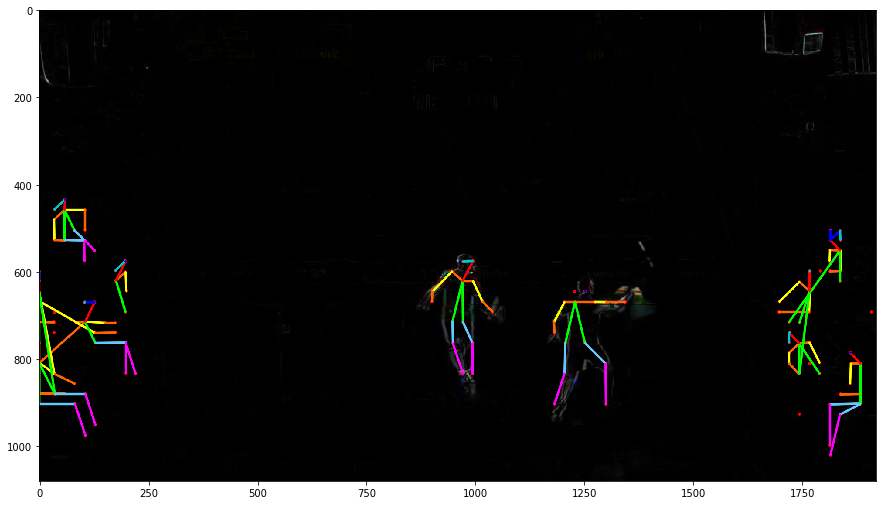

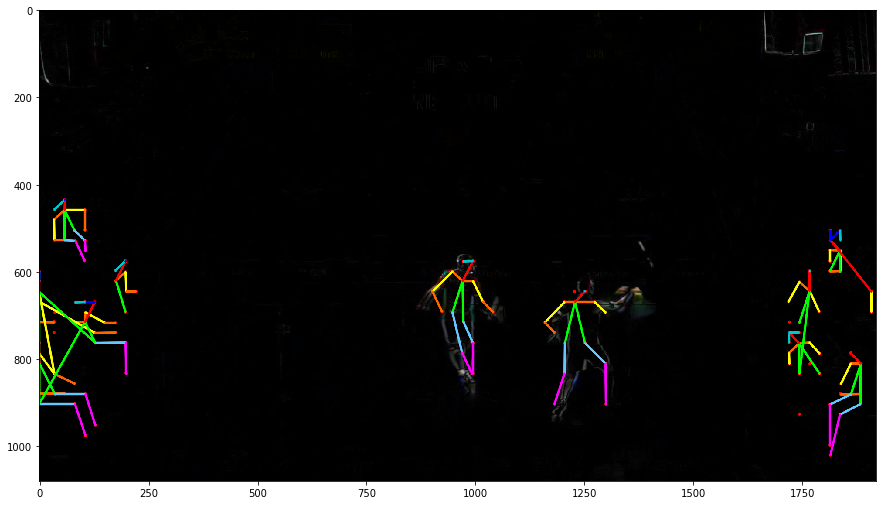

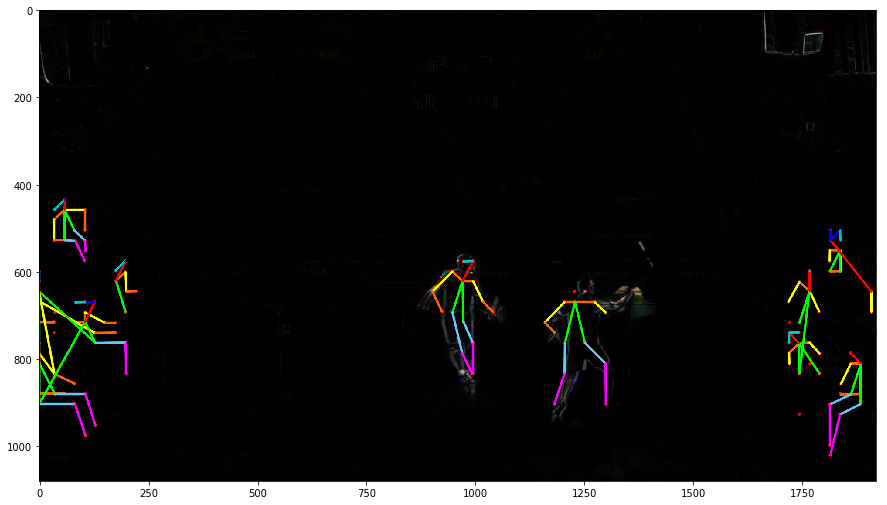

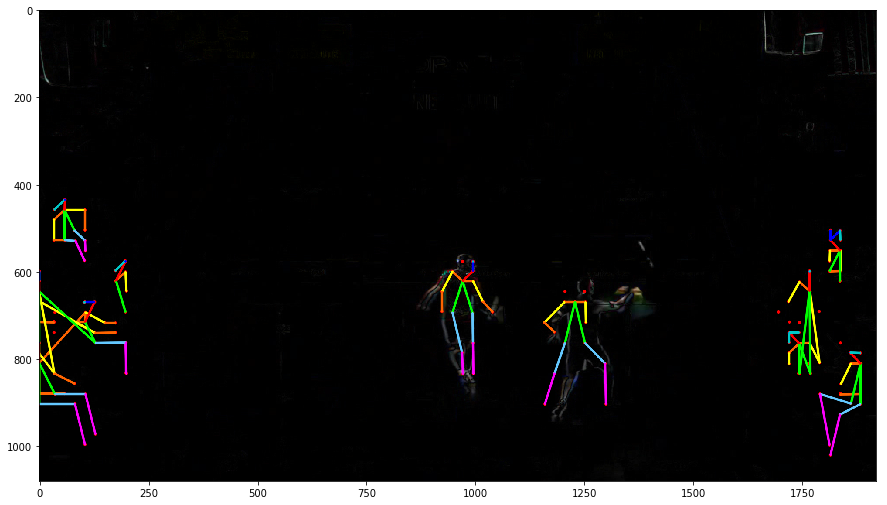

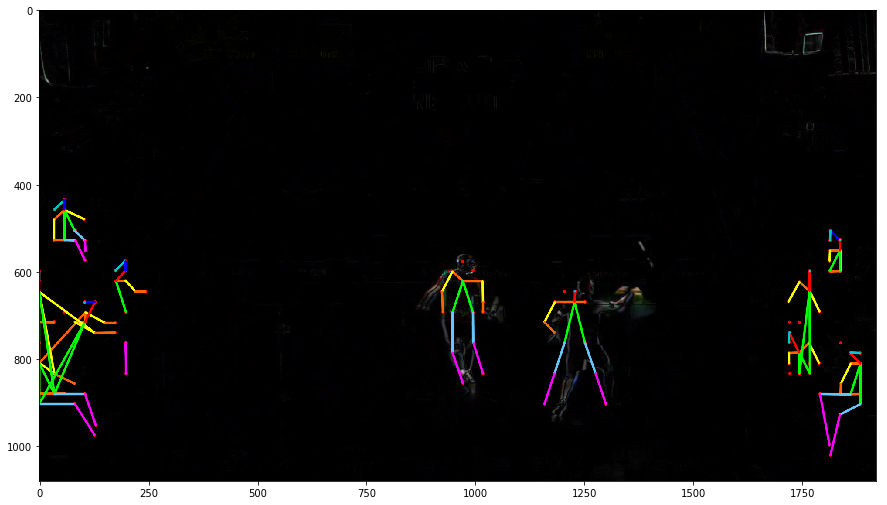

...

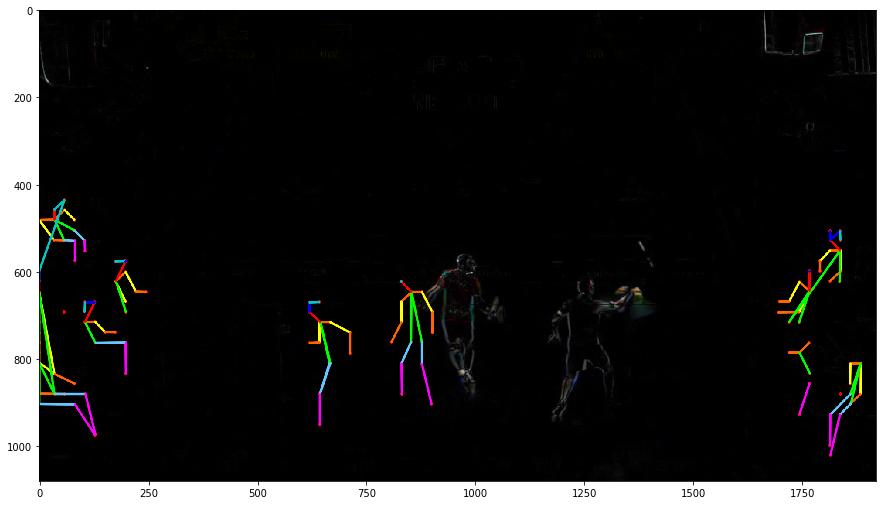

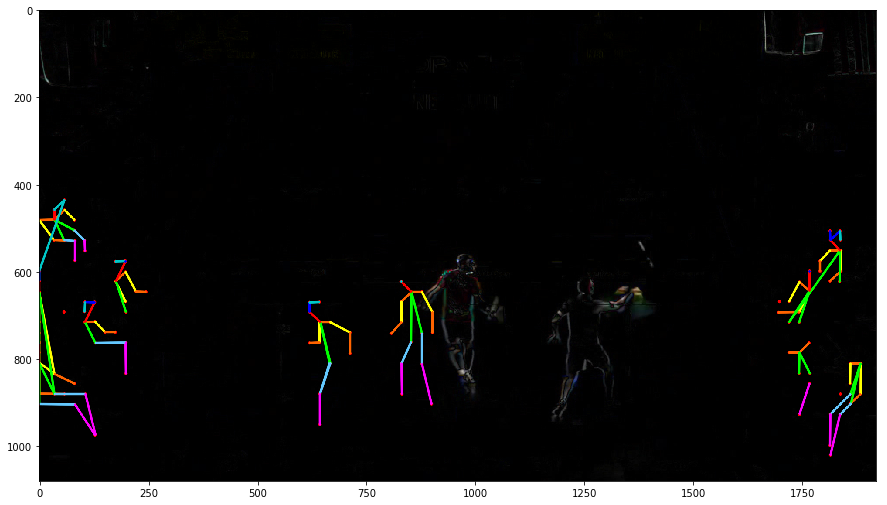

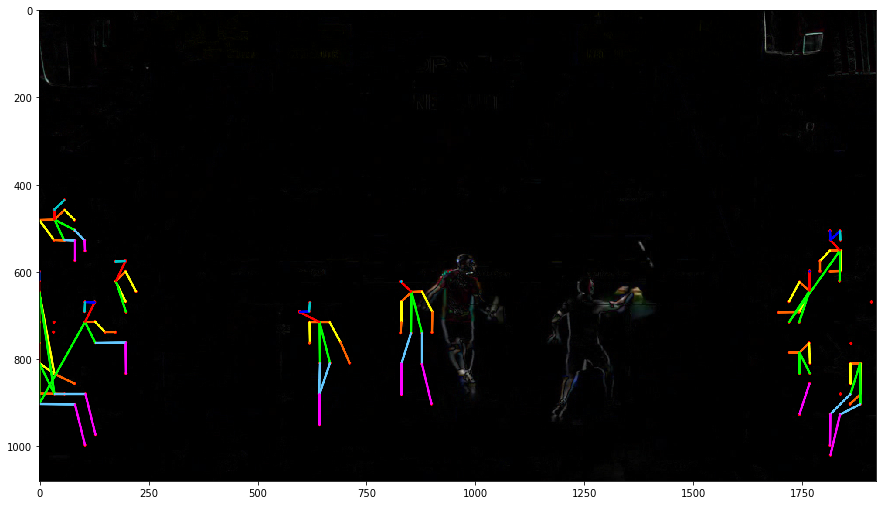

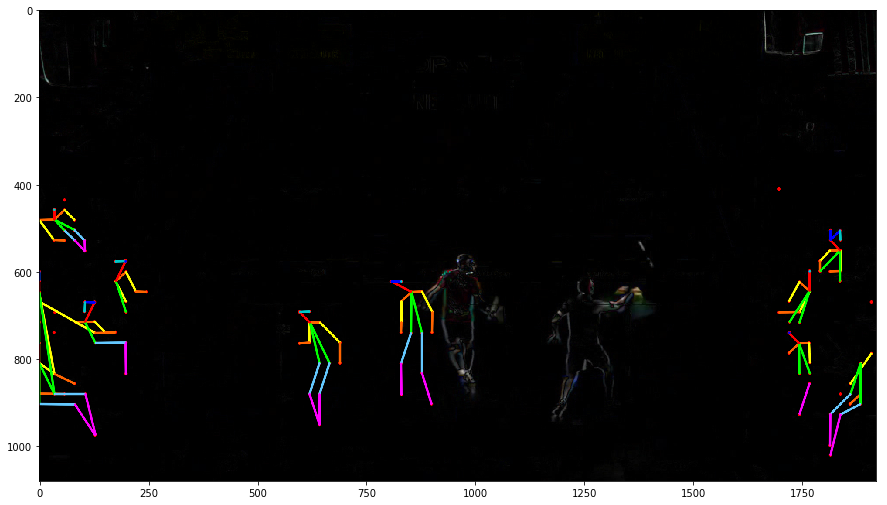

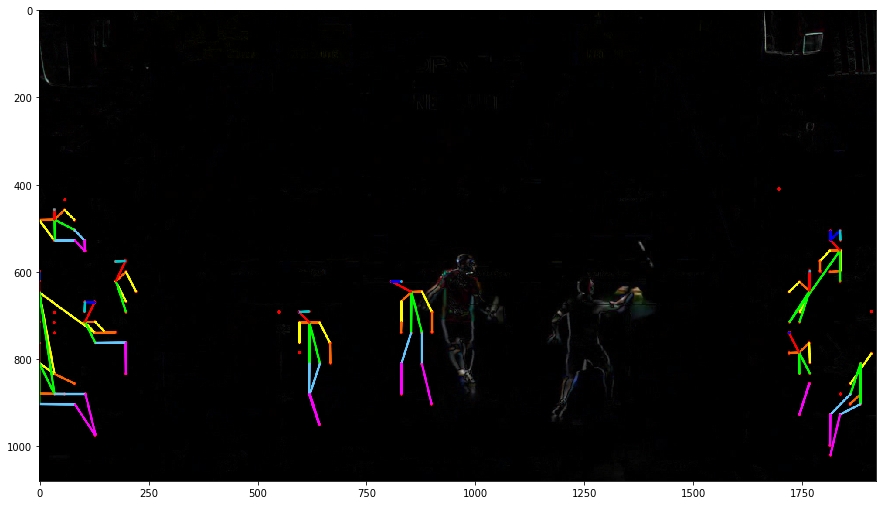

In [48]:
#ret, frame1 = cap.read()
#ret, frame2 = cap.read()

while (cap.isOpened()):
    ret, frame = cap.read()
    if ret == True: # Si esta capturando imagen
        #diff = cv2.absdiff(frame1, frame2)
        output = frameForwardPass(frame, net)
        keypoints_list, detected_keypoints = detectKeypoints(diff, output, 0.1, nPoints, keypointsMapping)
        frameClone = assignKeypoints(diff, output, detected_keypoints, keypoints_list)

        plt.figure(figsize=[15,15])
        plt.imshow(frameClone[:,:,[2,1,0]])
#         cv2.imshow('frame', frameClone[:,:,[2,1,0]])
        
        # Cambio al frame siguiente
#         frame1 = frame2
#         ret, frame2 = cap.read()
        
        if cv2.waitKey(50) & 0xFF == ord('q'): # El 0xFF es una mascara (para sistema 64-bit) que se le pone al waitKey
            break # Si presiona 'q' sale del loop
    else:
        break
        
cap.release() # Una vez que sale del loop hay que liberar la instancia de la memoria
cv2.destroyAllWindows() # Y destruir la ventana (sino queda la ventana frizada y no se cierra)

In [ ]:
dir_path = os.path.dirname(os.path.realpath(__file__))

# Change these variables to point to the correct folder (Release/x64 etc.)
sys.path.append(dir_path + '/../../python/openpose/Release');
os.environ['PATH']  = os.environ['PATH'] + ';' + dir_path + '/../../x64/Release;' +  dir_path + '/../../bin;'
import pyopenpose as op

In [49]:
#Setting OpenPose parameters
def set_params():

        params = dict()
        params["logging_level"] = 3
        params["output_resolution"] = "-1x-1"
        params["net_resolution"] = "-1x368"
        params["model_pose"] = "BODY_25"
        params["alpha_pose"] = 0.6
        params["scale_gap"] = 0.3
        params["scale_number"] = 1
        params["render_threshold"] = 0.05
        # If GPU version is built, and multiple GPUs are available, set the ID here
        params["num_gpu_start"] = 0
        params["disable_blending"] = False
        # Ensure you point to the correct path where models are located
        params["default_model_folder"] = dir_path + "/../../../models/"
        return params

def main():


        params = set_params()

        #Constructing OpenPose object allocates GPU memory
        openpose = OpenPose(params)

        #Opening OpenCV stream
        stream = cv2.VideoCapture(1)

        font = cv2.FONT_HERSHEY_SIMPLEX

        while True:

                ret,img = stream.read()

                # Output keypoints and the image with the human skeleton blended on it
                keypoints, output_image = openpose.forward(img, True)

                # Print the human pose keypoints, i.e., a [#people x #keypoints x 3]-dimensional numpy object with the keypoints of all the people on that image
                if len(keypoints)>0:
                        print('Human(s) Pose Estimated!')
                        print(keypoints)
                else:
                        print('No humans detected!')


                # Display the stream
                cv2.putText(output_image,'OpenPose using Python-OpenCV',(20,30), font, 1,(255,255,255),1,cv2.LINE_AA)

                cv2.imshow('Human Pose Estimation',output_image)

                key = cv2.waitKey(1)

                if key==ord('q'):
                        break

        stream.release()
        cv2.destroyAllWindows()

In [50]:
import openpose

ModuleNotFoundError: No module named 'openpose'